<a href="https://colab.research.google.com/github/Lusiji254/COA/blob/master/Deeplab_V3%2B_segmentation_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DeeplabV3+ uses Spartial Pyramid poolingthat enables the model to view the image from multiple scales and angles along with the encoder-decoder module which obtains sharp object boundaries. 

###Data preprocessing pipeline
Select only images with Pneumothorax for training

In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import numpy as np
import torch 
import cv2
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt 
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Recall, Precision, Accuracy


H = 512
W = 512

def create_dir(path):
    """ Create a directory. """
    if not os.path.exists(path):
        os.makedirs(path)

def load_data(path, split=0.2):
    train_images = sorted(glob(os.path.join(path, "aug_data/images", "*_1_.png")))
    train_masks = sorted(glob(os.path.join(path, "aug_data/masks", "*_1_.png")))
    test_x= sorted(glob(os.path.join(path, "test_images", "*_1_.png")))
    test_y= sorted(glob(os.path.join(path, "test_masks", "*_1_.png")))
     
    split_size = int(len(train_images) * split)

    train_x, valid_x = train_test_split(train_images, test_size=split_size, random_state=42)
    train_y, valid_y = train_test_split(train_masks, test_size=split_size, random_state=42)
    return (train_x, train_y),(test_x, test_y), (valid_x, valid_y)

def read_image(path):
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)
    return x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (W, H))
    x = x/np.max(x)
    x = x > 0.5
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)
    return x


def tf_parse(x, y):
    def _parse(x, y):
        x = x.decode()
        y = y.decode()
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape([H, W, 3])
    y.set_shape([H, W, 1])
    return x, y

def tf_dataset(X, Y, batch=8):
    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.shuffle(buffer_size=200)
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(4)
    return dataset




In [ ]:
    dataset_path = "/content/gdrive/MyDrive/Pneumothorax/"
    (train_x, train_y),(test_x, test_y),(valid_x, valid_y)= load_data(dataset_path)


    print(f"Train: {len(train_x)} - {len(train_y)}")
    print(f"Test: {len(test_x)} - {len(test_y)}")
    print(f"Valid: {len(valid_x)} - {len(valid_y)}")

Train: 9516 - 9516
Test: 290 - 290
Valid: 2379 - 2379


In [ ]:
x=read_image(train_x[879])

y=read_mask(train_y[879])
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
        
ax1.set_title('IMAGE')
ax1.imshow(x)

ax2.set_title('MASK')
ax2.imshow(y,cmap = 'gray')

x.shape, y.shape

##DeepLabv3+
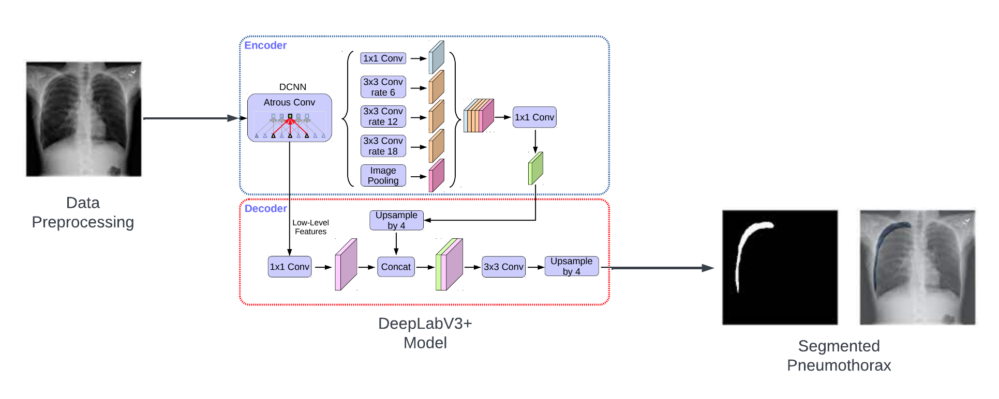

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input,LeakyReLU
from tensorflow.keras.layers import AveragePooling2D, GlobalAveragePooling2D, UpSampling2D, Reshape, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

"""Channelized attention mechanism"""
def SqueezeAndExcite(inputs, ratio=8):
    init = inputs
    filters = init.shape[-1]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
    x = init * se
    return x

def ASPP(inputs):
    """ Image Pooling """
    shape = inputs.shape
    y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(inputs)
    y1 = Conv2D(256, 1, padding="same", use_bias=False)(y1)
    y1 = BatchNormalization()(y1)
    y1 = Activation("relu")(y1)
    y1 = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y1)

    """ 1x1 conv """
    y2 = Conv2D(256, 1, padding="same", use_bias=False)(inputs)
    y2 = BatchNormalization()(y2)
    y2 = Activation("relu")(y2)

    """ 3x3 conv rate=6 """
    y3 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=6)(inputs)
    y3 = BatchNormalization()(y3)
    y3 = Activation("relu")(y3)

    """ 3x3 conv rate=12 """
    y4 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=12)(inputs)
    y4 = BatchNormalization()(y4)
    y4 = Activation("relu")(y4)

    """ 3x3 conv rate=18 """
    y5 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=18)(inputs)
    y5 = BatchNormalization()(y5)
    y5 = Activation("relu")(y5)

    y = Concatenate()([y1, y2, y3, y4, y5])
    y = Conv2D(256, 1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = Activation("relu")(y)

    return y

def deeplabv3_plus(shape):
    """ Input """
    inputs = Input(shape)

    """ Encoder """
    encoder = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)

    image_features = encoder.get_layer("conv4_block6_out").output
    x_a = ASPP(image_features)
    """Upsampling by 4"""
    x_a = UpSampling2D((4, 4), interpolation="bilinear")(x_a)

    """ 1x1 conv """
    x_b = encoder.get_layer("conv2_block2_out").output
    x_b = Conv2D(filters=48, kernel_size=1, padding='same', use_bias=False)(x_b)
    x_b = BatchNormalization()(x_b)
    x_b = Activation('relu')(x_b)

   """Concatenation"""
    x = Concatenate()([x_a, x_b])
    x = SqueezeAndExcite(x)
    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    """ 3x3 conv """
    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = SqueezeAndExcite(x)

    """Final Upsampling by 4"""
    x = UpSampling2D((4, 4), interpolation="bilinear")(x)
    x = Conv2D(1, 1)(x)
    x = Activation("sigmoid")(x)

    model = Model(inputs, x)
    return model

#if __name__ == "__main__":
    #model = deeplabv3_plus((512, 512, 3))

    #model.summary()

In [ ]:
from tensorflow.keras import backend as K

def iou(y_true, y_pred):
    smooth = 1
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

smooth = 1
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)
  

In [ ]:
if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)
    tf.random.set_seed(42)

    """ Directory for storing files """
    create_dir("/content/gdrive/MyDrive/Pneumothorax/pneumo-files")

    """ Hyperparameters """
    batch_size = 8
    lr = 1e-3
    num_epochs = 100
    model_path = os.path.join("/content/gdrive/MyDrive/Pneumothorax/pneumo-files", "pneumo-model_leakyrelu.h5")
    csv_path = os.path.join("/content/gdrive/MyDrive/Pneumothorax/pneumo-files", "data.csv")

    """Dataset"""
    dataset_path = "//content/gdrive/MyDrive/Pneumothorax"
    (train_x, train_y),(test_x, test_y),(valid_x, valid_y)= load_data(dataset_path)


    print(f"Train: {len(train_x)} - {len(train_y)}")
    print(f"Test: {len(test_x)} - {len(test_y)}")
    print(f"Valid: {len(valid_x)} - {len(valid_y)}")


    train_dataset = tf_dataset(train_x, train_y, batch=batch_size)
    valid_dataset = tf_dataset(valid_x, valid_y, batch=batch_size)
    
    """ Model """
    model = deeplabv3_plus((H, W, 3))
    metrics = [dice_coef, iou, Recall(), Precision(), Accuracy()]
    model.compile(loss=dice_loss, optimizer=Adam(lr), metrics=metrics)

     ## Training
    %rm -rf ./log
    %load_ext tensorboard
    %tensorboard --logdir='/content/gdrive/MyDrive/Pneumothorax/Tensorboard'
    %reload_ext tensorboard
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='/content/gdrive/MyDrive/Pneumothorax/Tensorboard')

    callbacks = [
        ModelCheckpoint(model_path, verbose=1, save_best_only=True),
        #ReduceLROnPlateau(monitor='val_dice_coef', factor=0.1, patience=5, min_lr=1e-7, verbose=1),
        EarlyStopping(monitor='val_dice_coef', patience=20, restore_best_weights=False),
        tensorboard_callback,
    ]

    model.fit(
        train_dataset,
        epochs=num_epochs,
        validation_data=valid_dataset,
        callbacks=callbacks
    )

In [ ]:
Epoch 37/100
1190/1190 [==============================] - ETA: 0s - loss: 0.1973 - dice_coef: 0.8028 - iou: 0.6770 - recall: 0.7807 - precision: 0.8582 - accuracy: 0.0088
Epoch 37: val_loss improved from 0.43483 to 0.31273, saving model to /content/gdrive/MyDrive/Pneumothorax/pneumo-files/pneumo-model_aug.h5
1190/1190 [==============================] - 1087s 913ms/step - loss: 0.1973 - dice_coef: 0.8028 - iou: 0.6770 - recall: 0.7807 - precision: 0.8582 - accuracy: 0.0088 - val_loss: 0.3127 - val_dice_coef: 0.6874 - val_iou: 0.5360 - val_recall: 0.6221 - val_precision: 0.8212 - val_accuracy: 0.0062 - lr: 1.0000e-04
Epoch 38/100

  0%|          | 0/20 [00:00<?, ?it/s]

1/1 [==============================] - 10s 10s/step


  5%|▌         | 1/20 [00:13<04:24, 13.91s/it]

1/1 [==============================] - 4s 4s/step


 10%|█         | 2/20 [00:19<02:39,  8.86s/it]

1/1 [==============================] - 4s 4s/step


 15%|█▌        | 3/20 [00:24<02:04,  7.29s/it]

1/1 [==============================] - 2s 2s/step


 20%|██        | 4/20 [00:27<01:27,  5.49s/it]

1/1 [==============================] - 2s 2s/step


 25%|██▌       | 5/20 [00:30<01:07,  4.48s/it]

1/1 [==============================] - 2s 2s/step


 30%|███       | 6/20 [00:32<00:51,  3.66s/it]

1/1 [==============================] - 2s 2s/step


 35%|███▌      | 7/20 [00:34<00:43,  3.33s/it]

1/1 [==============================] - 2s 2s/step


 40%|████      | 8/20 [00:37<00:37,  3.13s/it]

1/1 [==============================] - 2s 2s/step


 45%|████▌     | 9/20 [00:40<00:32,  2.98s/it]

1/1 [==============================] - 2s 2s/step


 50%|█████     | 10/20 [00:42<00:28,  2.89s/it]

1/1 [==============================] - 2s 2s/step


 55%|█████▌    | 11/20 [00:45<00:25,  2.82s/it]

1/1 [==============================] - 2s 2s/step


 60%|██████    | 12/20 [00:47<00:21,  2.69s/it]

1/1 [==============================] - 2s 2s/step


 65%|██████▌   | 13/20 [00:50<00:18,  2.68s/it]

1/1 [==============================] - 2s 2s/step


 70%|███████   | 14/20 [00:56<00:22,  3.75s/it]

1/1 [==============================] - 2s 2s/step


 75%|███████▌  | 15/20 [00:58<00:16,  3.24s/it]

1/1 [==============================] - 2s 2s/step


 80%|████████  | 16/20 [01:01<00:12,  3.07s/it]

1/1 [==============================] - 2s 2s/step


 85%|████████▌ | 17/20 [01:03<00:08,  2.76s/it]

1/1 [==============================] - 2s 2s/step


 90%|█████████ | 18/20 [01:06<00:05,  2.74s/it]

1/1 [==============================] - 2s 2s/step


 95%|█████████▌| 19/20 [01:08<00:02,  2.72s/it]

1/1 [==============================] - 2s 2s/step


100%|██████████| 20/20 [01:10<00:00,  2.52s/it]

1/1 [==============================] - 2s 2s/step


<ipython-input-8-635b778ccf28>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, (ax1, ax2, ax3) = plt.subplots(1,  3, figsize=(10,5))
21it [01:13,  2.57s/it]                        

1/1 [==============================] - 2s 2s/step


22it [01:16,  2.60s/it]

1/1 [==============================] - 2s 2s/step


23it [01:18,  2.43s/it]

1/1 [==============================] - 2s 2s/step


24it [01:20,  2.32s/it]

1/1 [==============================] - 2s 2s/step


25it [01:22,  2.25s/it]

1/1 [==============================] - 2s 2s/step


26it [01:24,  2.18s/it]

1/1 [==============================] - 2s 2s/step


27it [01:27,  2.33s/it]

1/1 [==============================] - 2s 2s/step


28it [01:29,  2.25s/it]

1/1 [==============================] - 2s 2s/step


29it [01:31,  2.38s/it]

1/1 [==============================] - 2s 2s/step


30it [01:34,  2.29s/it]

1/1 [==============================] - 2s 2s/step


31it [01:36,  2.23s/it]

1/1 [==============================] - 2s 2s/step


32it [01:38,  2.18s/it]

1/1 [==============================] - 2s 2s/step


33it [01:40,  2.14s/it]

1/1 [==============================] - 2s 2s/step


34it [01:42,  2.30s/it]

1/1 [==============================] - 2s 2s/step


35it [01:44,  2.24s/it]

1/1 [==============================] - 2s 2s/step


36it [01:47,  2.37s/it]

1/1 [==============================] - 2s 2s/step


37it [01:50,  2.46s/it]

1/1 [==============================] - 2s 2s/step


38it [01:52,  2.52s/it]

1/1 [==============================] - 2s 2s/step


39it [01:55,  2.38s/it]

1/1 [==============================] - 2s 2s/step


40it [01:57,  2.30s/it]

1/1 [==============================] - 2s 2s/step


41it [01:59,  2.41s/it]

1/1 [==============================] - 2s 2s/step


42it [02:03,  2.70s/it]

1/1 [==============================] - 3s 3s/step


43it [02:06,  3.01s/it]

1/1 [==============================] - 2s 2s/step


44it [02:09,  2.91s/it]

1/1 [==============================] - 2s 2s/step


45it [02:12,  2.84s/it]

1/1 [==============================] - 2s 2s/step


46it [02:14,  2.60s/it]

1/1 [==============================] - 2s 2s/step


47it [02:16,  2.45s/it]

1/1 [==============================] - 2s 2s/step


48it [02:18,  2.34s/it]

1/1 [==============================] - 2s 2s/step


49it [02:21,  2.44s/it]

1/1 [==============================] - 2s 2s/step


50it [02:23,  2.51s/it]

1/1 [==============================] - 2s 2s/step


51it [02:26,  2.56s/it]

1/1 [==============================] - 2s 2s/step


52it [02:29,  2.60s/it]

1/1 [==============================] - 2s 2s/step


53it [02:31,  2.62s/it]

1/1 [==============================] - 2s 2s/step


54it [02:34,  2.64s/it]

1/1 [==============================] - 2s 2s/step


55it [02:36,  2.46s/it]

1/1 [==============================] - 2s 2s/step


56it [02:39,  2.52s/it]

1/1 [==============================] - 2s 2s/step


57it [02:41,  2.57s/it]

1/1 [==============================] - 2s 2s/step


58it [02:44,  2.42s/it]

1/1 [==============================] - 2s 2s/step


59it [02:46,  2.50s/it]

1/1 [==============================] - 2s 2s/step


60it [02:48,  2.37s/it]

1/1 [==============================] - 2s 2s/step


61it [02:51,  2.46s/it]

1/1 [==============================] - 2s 2s/step


62it [02:53,  2.36s/it]

1/1 [==============================] - 2s 2s/step


63it [02:56,  2.45s/it]

1/1 [==============================] - 2s 2s/step


64it [02:58,  2.34s/it]

1/1 [==============================] - 2s 2s/step


65it [03:00,  2.26s/it]

1/1 [==============================] - 2s 2s/step


66it [03:02,  2.20s/it]

1/1 [==============================] - 2s 2s/step


67it [03:04,  2.16s/it]

1/1 [==============================] - 2s 2s/step


68it [03:07,  2.31s/it]

1/1 [==============================] - 2s 2s/step


69it [03:09,  2.42s/it]

1/1 [==============================] - 2s 2s/step


70it [03:12,  2.50s/it]

1/1 [==============================] - 2s 2s/step


71it [03:14,  2.37s/it]

1/1 [==============================] - 2s 2s/step


72it [03:16,  2.30s/it]

1/1 [==============================] - 2s 2s/step


73it [03:18,  2.25s/it]

1/1 [==============================] - 2s 2s/step


74it [03:21,  2.37s/it]

1/1 [==============================] - 2s 2s/step


75it [03:23,  2.30s/it]

1/1 [==============================] - 2s 2s/step


76it [03:25,  2.23s/it]

1/1 [==============================] - 2s 2s/step


77it [03:27,  2.18s/it]

1/1 [==============================] - 2s 2s/step


78it [03:30,  2.29s/it]

1/1 [==============================] - 2s 2s/step


79it [03:32,  2.23s/it]

1/1 [==============================] - 2s 2s/step


80it [03:35,  2.37s/it]

1/1 [==============================] - 2s 2s/step


81it [03:37,  2.46s/it]

1/1 [==============================] - 2s 2s/step


82it [03:39,  2.35s/it]

1/1 [==============================] - 2s 2s/step


83it [03:42,  2.45s/it]

1/1 [==============================] - 2s 2s/step


84it [03:45,  2.52s/it]

1/1 [==============================] - 2s 2s/step


85it [03:47,  2.40s/it]

1/1 [==============================] - 2s 2s/step


86it [03:49,  2.32s/it]

1/1 [==============================] - 2s 2s/step


87it [03:51,  2.26s/it]

1/1 [==============================] - 2s 2s/step


88it [03:54,  2.38s/it]

1/1 [==============================] - 2s 2s/step


89it [03:56,  2.30s/it]

1/1 [==============================] - 2s 2s/step


90it [03:59,  2.41s/it]

1/1 [==============================] - 2s 2s/step


91it [04:01,  2.49s/it]

1/1 [==============================] - 2s 2s/step


92it [04:03,  2.38s/it]

1/1 [==============================] - 2s 2s/step


93it [04:06,  2.29s/it]

1/1 [==============================] - 2s 2s/step


94it [04:08,  2.24s/it]

1/1 [==============================] - 2s 2s/step


95it [04:10,  2.37s/it]

1/1 [==============================] - 2s 2s/step


96it [04:12,  2.31s/it]

1/1 [==============================] - 4s 4s/step


97it [04:18,  3.20s/it]

1/1 [==============================] - 2s 2s/step


98it [04:20,  2.87s/it]

1/1 [==============================] - 2s 2s/step


99it [04:23,  2.81s/it]

1/1 [==============================] - 2s 2s/step


100it [04:25,  2.62s/it]

1/1 [==============================] - 2s 2s/step


101it [04:27,  2.47s/it]

1/1 [==============================] - 2s 2s/step


102it [04:29,  2.36s/it]

1/1 [==============================] - 2s 2s/step


103it [04:32,  2.45s/it]

1/1 [==============================] - 2s 2s/step


104it [04:34,  2.52s/it]

1/1 [==============================] - 2s 2s/step


105it [04:36,  2.41s/it]

1/1 [==============================] - 2s 2s/step


106it [04:38,  2.31s/it]

1/1 [==============================] - 2s 2s/step


107it [04:41,  2.25s/it]

1/1 [==============================] - 2s 2s/step


108it [04:43,  2.21s/it]

1/1 [==============================] - 2s 2s/step


109it [04:45,  2.35s/it]

1/1 [==============================] - 2s 2s/step


110it [04:48,  2.45s/it]

1/1 [==============================] - 2s 2s/step


111it [04:51,  2.52s/it]

1/1 [==============================] - 2s 2s/step


112it [04:53,  2.41s/it]

1/1 [==============================] - 2s 2s/step


113it [04:56,  2.49s/it]

1/1 [==============================] - 2s 2s/step


114it [04:58,  2.55s/it]

1/1 [==============================] - 2s 2s/step


115it [05:00,  2.42s/it]

1/1 [==============================] - 2s 2s/step


116it [05:03,  2.35s/it]

1/1 [==============================] - 2s 2s/step


117it [05:05,  2.27s/it]

1/1 [==============================] - 2s 2s/step


118it [05:07,  2.39s/it]

1/1 [==============================] - 2s 2s/step


119it [05:09,  2.30s/it]

1/1 [==============================] - 2s 2s/step


120it [05:12,  2.41s/it]

1/1 [==============================] - 2s 2s/step


121it [05:15,  2.49s/it]

1/1 [==============================] - 2s 2s/step


122it [05:17,  2.55s/it]

1/1 [==============================] - 2s 2s/step


123it [05:20,  2.59s/it]

1/1 [==============================] - 2s 2s/step


124it [05:23,  2.61s/it]

1/1 [==============================] - 2s 2s/step


125it [05:25,  2.63s/it]

1/1 [==============================] - 2s 2s/step


126it [05:28,  2.64s/it]

1/1 [==============================] - 2s 2s/step


127it [05:31,  2.65s/it]

1/1 [==============================] - 2s 2s/step


128it [05:33,  2.66s/it]

1/1 [==============================] - 2s 2s/step


129it [05:36,  2.66s/it]

1/1 [==============================] - 2s 2s/step


130it [05:39,  2.67s/it]

1/1 [==============================] - 2s 2s/step


131it [05:42,  2.67s/it]

1/1 [==============================] - 2s 2s/step


132it [05:44,  2.51s/it]

1/1 [==============================] - 2s 2s/step


133it [05:46,  2.39s/it]

1/1 [==============================] - 2s 2s/step


134it [05:48,  2.47s/it]

1/1 [==============================] - 2s 2s/step


135it [05:51,  2.36s/it]

1/1 [==============================] - 2s 2s/step


136it [05:53,  2.46s/it]

1/1 [==============================] - 2s 2s/step


137it [05:55,  2.36s/it]

1/1 [==============================] - 2s 2s/step


138it [05:58,  2.45s/it]

1/1 [==============================] - 2s 2s/step


139it [06:01,  2.52s/it]

1/1 [==============================] - 2s 2s/step


140it [06:03,  2.39s/it]

1/1 [==============================] - 2s 2s/step


141it [06:05,  2.48s/it]

1/1 [==============================] - 2s 2s/step


142it [06:08,  2.54s/it]

1/1 [==============================] - 2s 2s/step


143it [06:11,  2.58s/it]

1/1 [==============================] - 2s 2s/step


144it [06:13,  2.61s/it]

1/1 [==============================] - 2s 2s/step


145it [06:16,  2.63s/it]

1/1 [==============================] - 2s 2s/step


146it [06:18,  2.48s/it]

1/1 [==============================] - 2s 2s/step


147it [06:21,  2.54s/it]

1/1 [==============================] - 2s 2s/step


148it [06:24,  2.58s/it]

1/1 [==============================] - 2s 2s/step


149it [06:26,  2.61s/it]

1/1 [==============================] - 2s 2s/step


150it [06:28,  2.45s/it]

1/1 [==============================] - 2s 2s/step


151it [06:31,  2.36s/it]

1/1 [==============================] - 2s 2s/step


152it [06:33,  2.46s/it]

1/1 [==============================] - 2s 2s/step


153it [06:35,  2.36s/it]

1/1 [==============================] - 2s 2s/step


154it [06:38,  2.45s/it]

1/1 [==============================] - 2s 2s/step


155it [06:41,  2.52s/it]

1/1 [==============================] - 2s 2s/step


156it [06:43,  2.56s/it]

1/1 [==============================] - 2s 2s/step


157it [06:46,  2.59s/it]

1/1 [==============================] - 2s 2s/step


158it [06:49,  2.62s/it]

1/1 [==============================] - 2s 2s/step


159it [06:51,  2.64s/it]

1/1 [==============================] - 2s 2s/step


160it [06:54,  2.57s/it]

1/1 [==============================] - 2s 2s/step


161it [06:56,  2.60s/it]

1/1 [==============================] - 2s 2s/step


162it [06:59,  2.55s/it]

1/1 [==============================] - 2s 2s/step


163it [07:01,  2.49s/it]

1/1 [==============================] - 2s 2s/step


164it [07:04,  2.43s/it]

1/1 [==============================] - 2s 2s/step


165it [07:06,  2.51s/it]

1/1 [==============================] - 2s 2s/step


166it [07:09,  2.46s/it]

1/1 [==============================] - 2s 2s/step


167it [07:11,  2.44s/it]

1/1 [==============================] - 2s 2s/step


168it [07:13,  2.44s/it]

1/1 [==============================] - 2s 2s/step


169it [07:16,  2.52s/it]

1/1 [==============================] - 2s 2s/step


170it [07:19,  2.57s/it]

1/1 [==============================] - 2s 2s/step


171it [07:21,  2.55s/it]

1/1 [==============================] - 2s 2s/step


172it [07:24,  2.49s/it]

1/1 [==============================] - 2s 2s/step


173it [07:26,  2.48s/it]

1/1 [==============================] - 2s 2s/step


174it [07:28,  2.42s/it]

1/1 [==============================] - 2s 2s/step


175it [07:31,  2.50s/it]

1/1 [==============================] - 2s 2s/step


176it [07:34,  2.55s/it]

1/1 [==============================] - 2s 2s/step


177it [07:36,  2.50s/it]

1/1 [==============================] - 2s 2s/step


178it [07:39,  2.56s/it]

1/1 [==============================] - 2s 2s/step


179it [07:42,  2.73s/it]

1/1 [==============================] - 2s 2s/step


180it [07:44,  2.62s/it]

1/1 [==============================] - 2s 2s/step


181it [07:47,  2.55s/it]

1/1 [==============================] - 2s 2s/step


182it [07:49,  2.48s/it]

1/1 [==============================] - 2s 2s/step


183it [07:51,  2.46s/it]

1/1 [==============================] - 2s 2s/step


184it [07:54,  2.47s/it]

1/1 [==============================] - 2s 2s/step


185it [07:56,  2.43s/it]

1/1 [==============================] - 2s 2s/step


186it [07:59,  2.50s/it]

1/1 [==============================] - 2s 2s/step


187it [08:02,  2.55s/it]

1/1 [==============================] - 2s 2s/step


188it [08:04,  2.60s/it]

1/1 [==============================] - 2s 2s/step


189it [08:07,  2.62s/it]

1/1 [==============================] - 2s 2s/step


190it [08:10,  2.64s/it]

1/1 [==============================] - 2s 2s/step


191it [08:12,  2.66s/it]

1/1 [==============================] - 2s 2s/step


192it [08:15,  2.67s/it]

1/1 [==============================] - 2s 2s/step


193it [08:18,  2.67s/it]

1/1 [==============================] - 2s 2s/step


194it [08:20,  2.67s/it]

1/1 [==============================] - 2s 2s/step


195it [08:23,  2.60s/it]

1/1 [==============================] - 2s 2s/step


196it [08:26,  2.62s/it]

1/1 [==============================] - 2s 2s/step


197it [08:28,  2.64s/it]

1/1 [==============================] - 2s 2s/step


198it [08:31,  2.65s/it]

1/1 [==============================] - 2s 2s/step


199it [08:34,  2.65s/it]

1/1 [==============================] - 4s 4s/step


200it [08:39,  3.45s/it]

1/1 [==============================] - 2s 2s/step


201it [08:41,  3.14s/it]

1/1 [==============================] - 2s 2s/step


202it [08:44,  3.01s/it]

1/1 [==============================] - 2s 2s/step


203it [08:47,  2.91s/it]

1/1 [==============================] - 2s 2s/step


204it [08:49,  2.73s/it]

1/1 [==============================] - 2s 2s/step


205it [08:51,  2.59s/it]

1/1 [==============================] - 2s 2s/step


206it [08:53,  2.49s/it]

1/1 [==============================] - 2s 2s/step


207it [08:56,  2.54s/it]

1/1 [==============================] - 2s 2s/step


208it [08:58,  2.48s/it]

1/1 [==============================] - 2s 2s/step


209it [09:01,  2.54s/it]

1/1 [==============================] - 2s 2s/step


210it [09:03,  2.48s/it]

1/1 [==============================] - 2s 2s/step


211it [09:06,  2.45s/it]

1/1 [==============================] - 2s 2s/step


212it [09:08,  2.43s/it]

1/1 [==============================] - 2s 2s/step


213it [09:11,  2.50s/it]

1/1 [==============================] - 2s 2s/step


214it [09:13,  2.44s/it]

1/1 [==============================] - 2s 2s/step


215it [09:16,  2.42s/it]

1/1 [==============================] - 2s 2s/step


216it [09:18,  2.50s/it]

1/1 [==============================] - 2s 2s/step


217it [09:21,  2.55s/it]

1/1 [==============================] - 2s 2s/step


218it [09:24,  2.60s/it]

1/1 [==============================] - 2s 2s/step


219it [09:26,  2.63s/it]

1/1 [==============================] - 2s 2s/step


220it [09:29,  2.55s/it]

1/1 [==============================] - 2s 2s/step


221it [09:31,  2.60s/it]

1/1 [==============================] - 2s 2s/step


222it [09:34,  2.52s/it]

1/1 [==============================] - 2s 2s/step


223it [09:36,  2.58s/it]

1/1 [==============================] - 2s 2s/step


224it [09:39,  2.61s/it]

1/1 [==============================] - 2s 2s/step


225it [09:41,  2.51s/it]

1/1 [==============================] - 2s 2s/step


226it [09:44,  2.57s/it]

1/1 [==============================] - 2s 2s/step


227it [09:47,  2.60s/it]

1/1 [==============================] - 2s 2s/step


228it [09:50,  2.63s/it]

1/1 [==============================] - 2s 2s/step


229it [09:52,  2.58s/it]

1/1 [==============================] - 2s 2s/step


230it [09:54,  2.50s/it]

1/1 [==============================] - 2s 2s/step


231it [09:57,  2.55s/it]

1/1 [==============================] - 2s 2s/step


232it [10:00,  2.59s/it]

1/1 [==============================] - 2s 2s/step


233it [10:02,  2.61s/it]

1/1 [==============================] - 2s 2s/step


234it [10:05,  2.63s/it]

1/1 [==============================] - 2s 2s/step


235it [10:08,  2.65s/it]

1/1 [==============================] - 2s 2s/step


236it [10:10,  2.64s/it]

1/1 [==============================] - 3s 3s/step


237it [10:16,  3.42s/it]

1/1 [==============================] - 2s 2s/step


238it [10:18,  3.08s/it]

1/1 [==============================] - 2s 2s/step


239it [10:21,  2.96s/it]

1/1 [==============================] - 2s 2s/step


240it [10:23,  2.87s/it]

1/1 [==============================] - 2s 2s/step


241it [10:26,  2.81s/it]

1/1 [==============================] - 2s 2s/step


242it [10:28,  2.64s/it]

1/1 [==============================] - 2s 2s/step


243it [10:30,  2.50s/it]

1/1 [==============================] - 2s 2s/step


244it [10:33,  2.55s/it]

1/1 [==============================] - 2s 2s/step


245it [10:36,  2.60s/it]

1/1 [==============================] - 2s 2s/step


246it [10:38,  2.50s/it]

1/1 [==============================] - 2s 2s/step


247it [10:40,  2.41s/it]

1/1 [==============================] - 2s 2s/step


248it [10:42,  2.36s/it]

1/1 [==============================] - 2s 2s/step


249it [10:46,  2.60s/it]

1/1 [==============================] - 2s 2s/step


250it [10:48,  2.49s/it]

1/1 [==============================] - 2s 2s/step


251it [10:50,  2.42s/it]

1/1 [==============================] - 2s 2s/step


252it [10:53,  2.50s/it]

1/1 [==============================] - 2s 2s/step


253it [10:55,  2.55s/it]

1/1 [==============================] - 2s 2s/step


254it [10:58,  2.59s/it]

1/1 [==============================] - 2s 2s/step


255it [11:01,  2.62s/it]

1/1 [==============================] - 2s 2s/step


256it [11:03,  2.64s/it]

1/1 [==============================] - 2s 2s/step


257it [11:06,  2.65s/it]

1/1 [==============================] - 2s 2s/step


258it [11:09,  2.66s/it]

1/1 [==============================] - 2s 2s/step


259it [11:11,  2.67s/it]

1/1 [==============================] - 2s 2s/step


260it [11:14,  2.51s/it]

1/1 [==============================] - 2s 2s/step


261it [11:16,  2.56s/it]

1/1 [==============================] - 2s 2s/step


262it [11:19,  2.47s/it]

1/1 [==============================] - 2s 2s/step


263it [11:21,  2.41s/it]

1/1 [==============================] - 2s 2s/step


264it [11:24,  2.49s/it]

1/1 [==============================] - 2s 2s/step


265it [11:26,  2.42s/it]

1/1 [==============================] - 2s 2s/step


266it [11:28,  2.39s/it]

1/1 [==============================] - 2s 2s/step


267it [11:30,  2.34s/it]

1/1 [==============================] - 2s 2s/step


268it [11:33,  2.33s/it]

1/1 [==============================] - 2s 2s/step


269it [11:35,  2.44s/it]

1/1 [==============================] - 2s 2s/step


270it [11:38,  2.39s/it]

1/1 [==============================] - 2s 2s/step


271it [11:40,  2.48s/it]

1/1 [==============================] - 2s 2s/step


272it [11:42,  2.39s/it]

1/1 [==============================] - 2s 2s/step


273it [11:45,  2.48s/it]

1/1 [==============================] - 2s 2s/step


274it [11:47,  2.41s/it]

1/1 [==============================] - 2s 2s/step


275it [11:50,  2.37s/it]

1/1 [==============================] - 2s 2s/step


276it [11:52,  2.33s/it]

1/1 [==============================] - 2s 2s/step


277it [11:55,  2.44s/it]

1/1 [==============================] - 2s 2s/step


278it [11:57,  2.40s/it]

1/1 [==============================] - 2s 2s/step


279it [11:59,  2.34s/it]

1/1 [==============================] - 2s 2s/step


280it [12:01,  2.31s/it]

1/1 [==============================] - 2s 2s/step


281it [12:04,  2.42s/it]

1/1 [==============================] - 2s 2s/step


282it [12:07,  2.51s/it]

1/1 [==============================] - 2s 2s/step


283it [12:09,  2.56s/it]

1/1 [==============================] - 2s 2s/step


284it [12:12,  2.47s/it]

1/1 [==============================] - 2s 2s/step


285it [12:14,  2.53s/it]

1/1 [==============================] - 2s 2s/step


286it [12:17,  2.58s/it]

1/1 [==============================] - 2s 2s/step


287it [12:19,  2.47s/it]

1/1 [==============================] - 2s 2s/step


288it [12:22,  2.40s/it]

1/1 [==============================] - 2s 2s/step


289it [12:24,  2.36s/it]

1/1 [==============================] - 2s 2s/step


290it [12:26,  2.57s/it]


ValueError: ignored

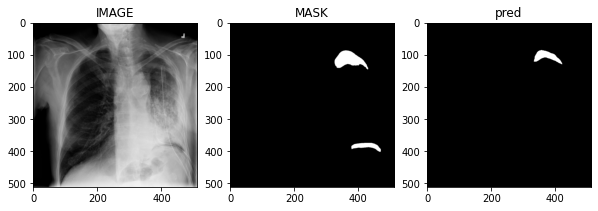

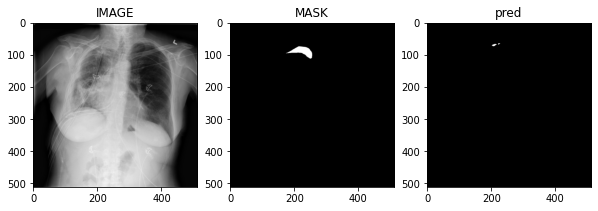

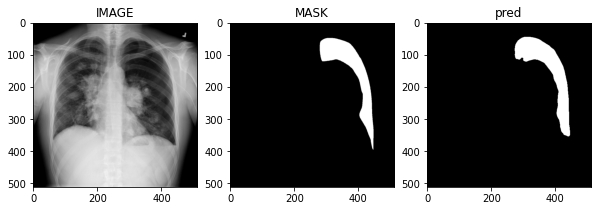

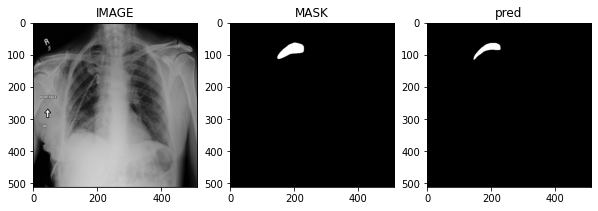

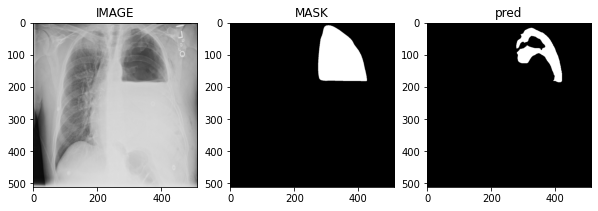

...

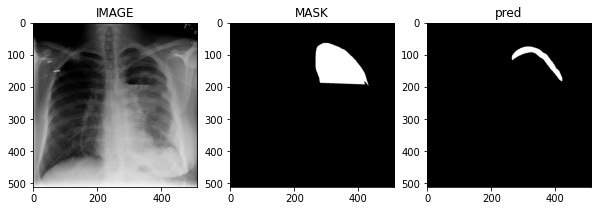

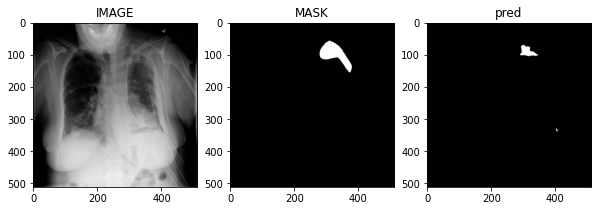

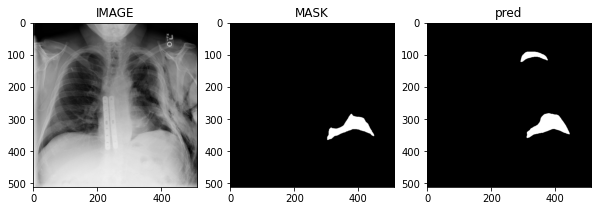

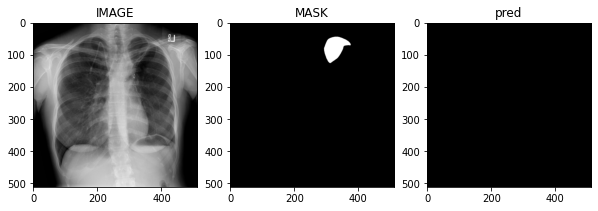

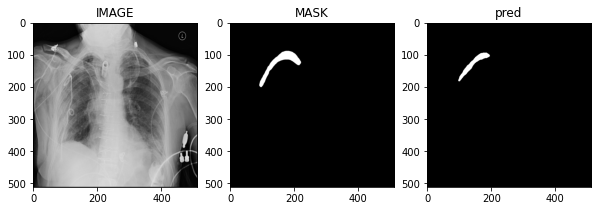

In [ ]:
from tensorflow.keras.utils import CustomObjectScope


H = 512
W = 512

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)
    tf.random.set_seed(42)

    """ Directory for storing files """
    create_dir("results")

    """ Loading model """
    with CustomObjectScope({ 'iou': iou,'dice_coef': dice_coef, 'dice_loss': dice_loss}):
        model = tf.keras.models.load_model("/content/gdrive/MyDrive/Pneumothorax/pneumo-files/pneumo-model.h5", compile = True)

    """Dataset"""
    dataset_path = "//content/gdrive/MyDrive/Pneumothorax"
    (train_x, train_y),(test_x, test_y),(valid_x, valid_y)= load_data(dataset_path)

    
   

    """ Predicting the mask """
    for x, y in tqdm(zip(test_x, test_y)):
        """ Extracing the image name. """
        image_name = x.split("/")[-1]

        """ Reading the image """
        ori_x = cv2.imread(x, cv2.IMREAD_COLOR)
        ori_x = cv2.resize(ori_x, (W, H))
        x = ori_x/255.0
        x = x.astype(np.float32)
        x = np.expand_dims(x, axis=0)

        """ Reading the mask """
        ori_y = cv2.imread(y, cv2.IMREAD_GRAYSCALE)
        ori_y = cv2.resize(ori_y, (W, H))
        ori_y = np.expand_dims(ori_y, axis=-1)  ## (512, 512, 1)
        ori_y = np.concatenate([ori_y, ori_y, ori_y], axis=-1)  ## (512, 512, 3)


        """ Predicting the mask. """
        y_pred = model.predict(x)[0] > 0.5
        y_pred = np.squeeze(y_pred, axis=-1)
        y_pred = y_pred.astype(np.int32)
      
       


           
        f, (ax1, ax2, ax3) = plt.subplots(1,  3, figsize=(10,5))
                
        ax1.set_title('IMAGE'%image_name)
        ax1.imshow(ori_x)

        ax2.set_title('MASK')
        ax2.imshow(ori_y,cmap = 'gray')

        ax3.set_title('pred')
        ax3.imshow(y_pred,cmap = 'gray')

        y_pred.shape



In [ ]:
from tensorflow.keras.utils import CustomObjectScope


H = 512
W = 512

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)
    tf.random.set_seed(42)

    """ Directory for storing files """
    create_dir("results")

    """ Loading model """
    with CustomObjectScope({ 'iou': iou,'dice_coef': dice_coef, 'dice_loss': dice_loss},):
        model = tf.keras.models.load_model("/content/gdrive/MyDrive/Pneumothorax/pneumo-files/pneumo-model_aug.h5", compile = True)

    """Dataset"""
    dataset_path = "//content/gdrive/MyDrive/Pneumothorax"
    test_dataset = tf_dataset(test_x, test_y, batch = 16)
    batch = 16
    results = model.evaluate(test_dataset, steps = (len(test_x)//batch) + 1)



  

In [ ]:
19/19 [==============================] - 621s 30s/step - loss: 0.3227 - dice_coef: 0.7174 - iou: 0.6874 - recall: 0.4117 - precision: 0.7412 - accuracy: 0.0035